In [1]:
import sys
sys.path.insert(0, '/home/ggorin/projects/monod/src/')

In [2]:
import monod
from monod import preprocess, extract_data, cme_toolbox, inference, analysis

In [3]:
import pandas as pd
import numpy as np
import loompy as lp
import matplotlib.pyplot as plt
import scipy

In [4]:
meta_path = "/home/tchari/metadata/"
meta = pd.read_csv(meta_path+'norman_GSE133344_filtered_cell_identities.csv')

#'guide_identity'

In [5]:
dataset_meta = ['allcrispr']
print('dataset_meta: ', dataset_meta)
print()

subcluster_names = [['DUSP9_MAPK1__DUSP9_MAPK1'],['ETS2_MAPK1__ETS2_MAPK1'],['MAPK1_NegCtrl0__MAPK1_NegCtrl0','NegCtrl0_MAPK1__NegCtrl0_MAPK1'],
                    ['NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0'],['NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0'],
                   ['NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0'],['NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0'],
                   ['DUSP9_ETS2__DUSP9_ETS2'],['NegCtrl0_ETS2__NegCtrl0_ETS2','ETS2_NegCtrl0__ETS2_NegCtrl0'],
                   ['DUSP9_NegCtrl0__DUSP9_NegCtrl0'],['CBL_NegCtrl0__CBL_NegCtrl0'],['CBL_CNN1__CBL_CNN1'],
                   ['NegCtrl0_CNN1__NegCtrl0_CNN1','CNN1_NegCtrl0__CNN1_NegCtrl0'],
                   ['NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0','NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0',
                    'NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0']]

sub_names_only = ['_'.join(n) for n in subcluster_names]

cluster_names = []
dataset_names = ['norman_'+dataset_meta[0]+'_'+y  for y in sub_names_only]   #To save
print('dataset_names: ', dataset_names)
print('len(dataset_names): ',len(dataset_names))
print()

raw_data_locations = [dataset_meta[0] for y in sub_names_only]
transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200525_genome_polyA_cum_3'

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'gene_name'
cell_attr = 'barcode'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/norman_crispr/loom/'+x+'.loom' for x in raw_data_locations] 
print('loom_filepaths: ',loom_filepaths)

n_datasets = len(loom_filepaths)

dataset_meta:  ['allcrispr']

dataset_names:  ['norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1', 'norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1', 'norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1', 'norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0', 'norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0', 'norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0', 'norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0', 'norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2', 'norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0', 'norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0', 'norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0', 'norman_allcrispr_CBL_CNN1__CBL_CNN1', 'norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0', 'norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0']
len(dataset_names):  14

loom_filepaths:  ['/home/tchari/counts/norman_crispr/lo

## **Cell Preprocessing**

Filter cell barcodes with low UMI counts and overlap with published annotations

Dataset allcrispr. 
	116844 barcodes in loom, 94649 pass filter. TTGAACGAGACTCGGA-2CGTTGGGGTGTTTGTG-7GAACCTAAGTGTTAGA-6CCTTCCCTCCGTCATC-4TCAATCTGTCTTTCAT-2TCCCGATGTCTCTTAT-8AAACCTGTCCAGAAGG-2CTGCCTAGTTCCACAA-4GAACCTATCCAGAAGG-3AAGCCGCTCACTCCTG-5TTCTTAGCATGGGAAC-7GACGGCTTCGTCACGG-1TGCGGGTCATTCACTT-8GGACAAGGTAGGGACT-5CGCGGTAGTGAGTATA-8CTGATAGTCACAGGCC-3ACGGAGACAATGGATA-5CATGGCGGTATATGAG-5ACATGGTGTCCAGTAT-5GACCAATTCAACACAC-4AACACGTCATTCTTAC-4CTAGCCTTCAACACGT-4GAACCTAAGCTCTCGG-5GCGCCAAGTGTGACCC-6CGCGGTAAGATAGTCA-1CGTTAGAGTTCGTGAT-8TGCTACCAGCGATTCT-5CGGTTAATCTTCTGGC-5AGACGTTGTCTAGCGC-2TTGGAACTCAAGCCTA-7TCAATCTCATTGAGCT-5CTAACTTCAGACGCTC-5CAACCTCAGGCGACAT-5AGACGTTGTCAAACTC-5CCAATCCAGTCAAGCG-5TACGGATTCGGATGGA-5ACGCCAGTCATCTGCC-5CAGCTGGGTTCGTTGA-4TCGGGACCAATAGCGG-1AACCATGTCTCTGAGA-5ATTATCCAGCGTGTCC-5TATCAGGCAAGCGATG-5AACCGCGCATTGGTAC-3GCGCAGTGTCCAAGTT-5TTGGAACCAGGGAGAG-7ATGCGATAGTACGCGA-5GCGCCAACACACCGCA-8AACGTTGAGCGTAGTG-1CAGCATATCTCAACTT-2TCCCGATGTAAACGCG-5ATGAGGGCATTGGCGC-2TAGGCATCACAGAGGT-

	['DUSP9_MAPK1__DUSP9_MAPK1']: 290 cells in annotations. 290 in loom. 260 pass filter.
	['ETS2_MAPK1__ETS2_MAPK1']: 459 cells in annotations. 459 in loom. 321 pass filter.
	['MAPK1_NegCtrl0__MAPK1_NegCtrl0', 'NegCtrl0_MAPK1__NegCtrl0_MAPK1']: 765 cells in annotations. 765 in loom. 671 pass filter.
	['NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0']: 3532 cells in annotations. 3532 in loom. 3255 pass filter.
	['NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0']: 2839 cells in annotations. 2839 in loom. 2622 pass filter.
	['NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0']: 2948 cells in annotations. 2948 in loom. 2679 pass filter.
	['NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0']: 2536 cells in annotations. 2536 in loom. 2362 pass filter.
	['DUSP9_ETS2__DUSP9_ETS2']: 787 cells in annotations. 787 in loom. 634 pass filter.
	['NegCtrl0_ETS2__NegCtrl0_ETS2', 'ETS2_NegCtrl0__ETS2_NegCtrl0']: 1201 cells in annotations. 1201 in loom. 1085 pass filter.
	['DUSP9_NegCtrl0__DUSP9_NegCtrl0']: 731 cells in annotations. 731 in loom. 57

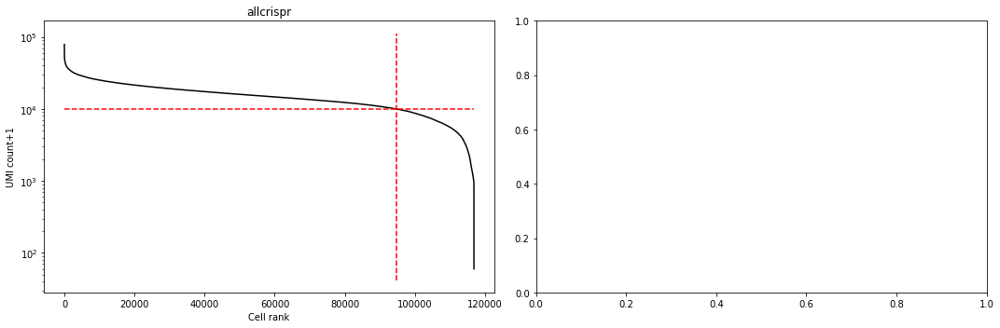

In [6]:
cf = []
thr_lb = [1e4]*len(dataset_meta)*2

fig1,ax1 = plt.subplots(1,len(dataset_meta)*2,figsize=(15,5))

for k in range(len(dataset_meta)):
    filename = loom_filepaths[len(subcluster_names)*k]
    dataset_name = raw_data_locations[len(subcluster_names)*k]
    
    with lp.connect(filename,mode='r') as ds:
        S = ds.layers[spliced_layer][:]
        U = ds.layers[unspliced_layer][:]
        gene_names = ds.ra[gene_attr]
        bcs = ds.ca[cell_attr]
        n_cells = S.shape[1]
        monod.preprocess.knee_plot(S+U,ax1[k],viz=True,thr=thr_lb[k])
        cf_ = ((S+U).sum(0)>thr_lb[k])
        
        n_annot_bcs = meta['cell_barcode'].sum()
        annot_bcs_in_loom = meta['cell_barcode'].isin(bcs).sum()
        annot_bcs_in_filt_loom = meta['cell_barcode'].isin(bcs[cf_]).sum()
        print(f'Dataset {dataset_name}. \n\t{len(bcs)} barcodes in loom, {cf_.sum()} pass filter. {n_annot_bcs} in annotations; of these, {annot_bcs_in_loom} in loom and {annot_bcs_in_filt_loom} in filtered loom.')
        
        #if k==0:
        for subcluster in subcluster_names:
            annot_bcs = meta[(meta['guide_identity'].isin(subcluster))]['cell_barcode']
            cf.append(np.isin(bcs,annot_bcs) & cf_)
            print(f'\t{subcluster}: {len(annot_bcs)} cells in annotations. {np.isin(bcs,annot_bcs).sum()} in loom. {cf[-1].sum()} pass filter.')



    ax1[k].set_title(dataset_name)
    
!mkdir ./figs    
fig_dir = './figs/'
fig_string = fig_dir + 'kneeplots_all.png'
fig1.tight_layout()
plt.savefig(fig_string,dpi=450)

In [7]:
print("Cells per subcluster: ", [x.sum() for x in cf])

Cells per subcluster:  [260, 321, 671, 3255, 2622, 2679, 2362, 634, 1085, 579, 604, 246, 675, 8239]


## **Gene Filtering**

Filter for genes with moderate expression across cells in dataset(s). 

In [6]:
import logging, sys
logging.basicConfig(stream=sys.stdout)
log = logging.getLogger()
log.setLevel(logging.INFO)

In [9]:
!mkdir ./fits

mkdir: cannot create directory ‘./fits’: File exists


INFO:root:Beginning data preprocessing and filtering.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0 created.
INFO:root:Dataset: norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1
INFO:root:260 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:925 genes retained after expression filter.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1 created.
INFO:root:Dataset: norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1
INFO:root:321 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:925 genes retained after expression filter.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1 created.
INFO:root:Dataset: norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1
INFO:root:671 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were 

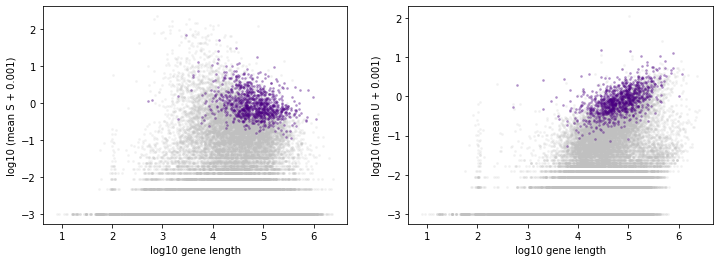

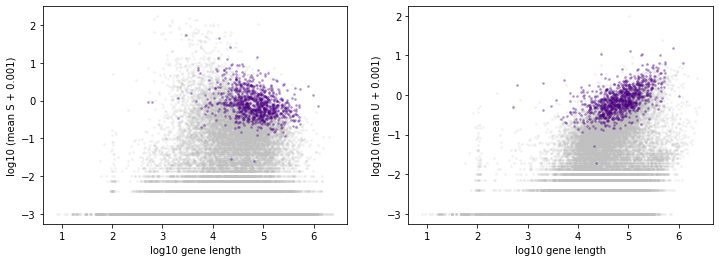

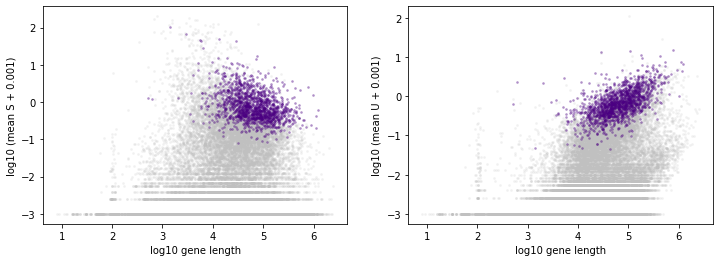

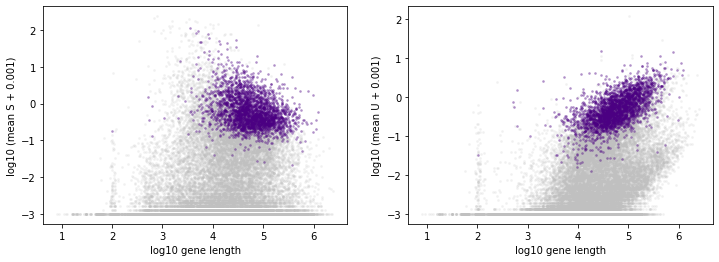

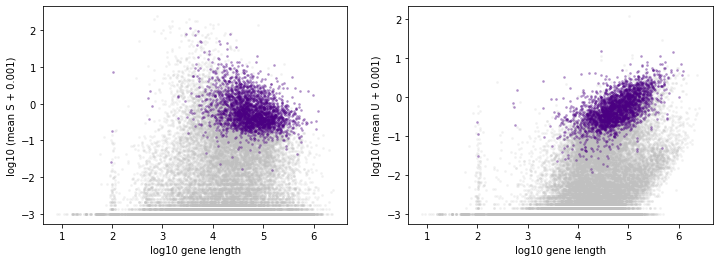

...

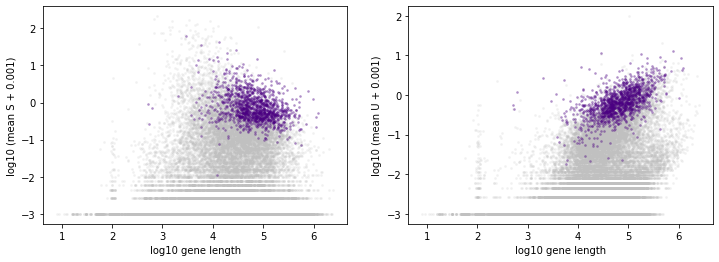

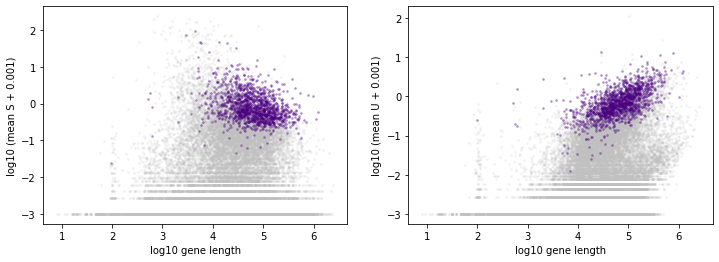

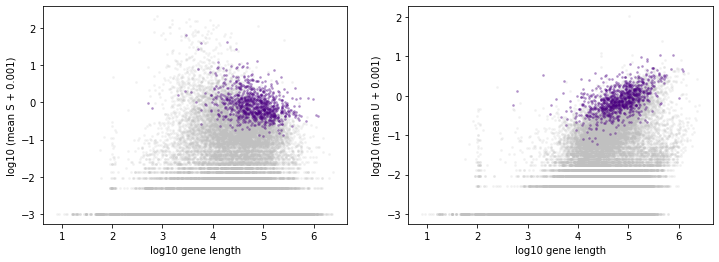

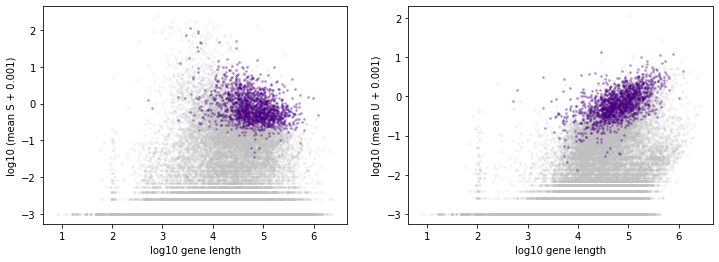

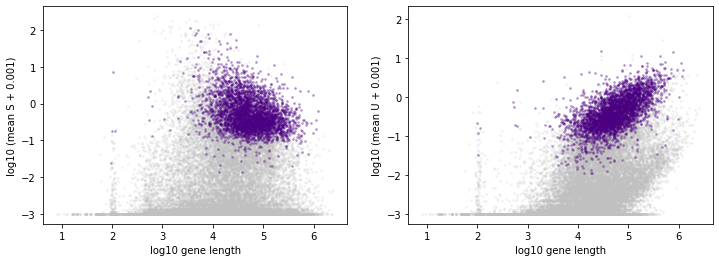

In [10]:
dir_string,dataset_strings = monod.preprocess.construct_batch(loom_filepaths, \
                                             transcriptome_filepath, \
                                             dataset_names, \
                                             attribute_names=attribute_names,\
                                             batch_location='./fits',meta='norman_crispr',batch_id=0,\
                                             n_genes=3000,exp_filter_threshold=None,cf=cf)

ls: cannot access './fits/gg_221004_024_norman_crispr_0': No such file or directory


## **Inference**
Run inference for each subcluster

INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [28:25<00:00,  4.06s/it]/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/proje

/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggor

INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1720.8 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_221005_

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [22:36<00:00,  3.23s/it]/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: Ru

/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py

/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:543: RuntimeWarning: divide by zero encountered in double_scalars
  gamma = b / moments["S_mean"]
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py

INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1368.4 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/no

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [25:03<00:00,  3.58s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1515.6 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCt

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [31:37<00:00,  4.52s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1910.3 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [32:07<00:00,  4.59s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1940.7 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/diagnos

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [35:37<00:00,  5.09s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 2152.0 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/diagnosti

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [38:41<00:00,  5.53s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 2338.6 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/diagnostic_figures created.
INFO:root:Search data stored to ./fit

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [25:09<00:00,  3.59s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1524.3 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcris

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [26:06<00:00,  3.73s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1582.7 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/diagnostic_f

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [24:55<00:00,  3.56s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1511.4 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/diagnostic_figures created.
INFO:root:Search data store

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [24:57<00:00,  3.57s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1513.2 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_CBL_CNN1__CBL_CNN1
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_221005_024_norman_cri

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [23:02<00:00,  3.29s/it]/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/proje

/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggorin/projects/monod/src/monod/cme_toolbox.py:534: RuntimeWarning: invalid value encountered in double_scalars
  b = moments["U_var"] / moments["U_mean"] - 1
/home/ggor

INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1397.1 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221005_024_norman_crispr_0/genes.csv.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_N

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [25:43<00:00,  3.68s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 1561.4 seconds.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0
INFO:root:36601 features observed,

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [39:41<00:00,  5.67s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 2399.8 seconds.


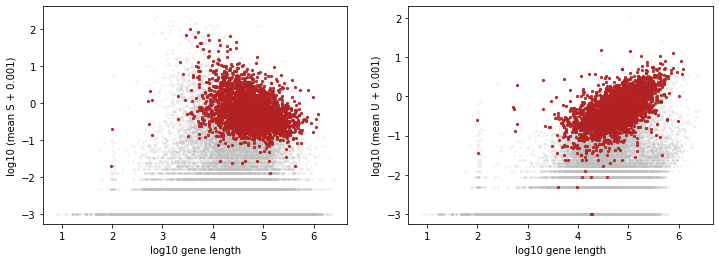

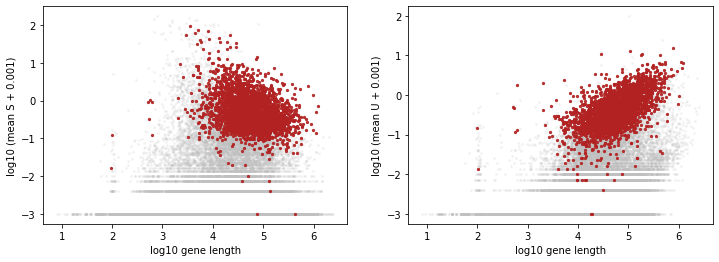

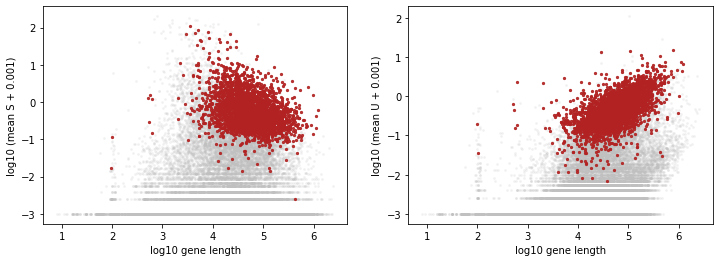

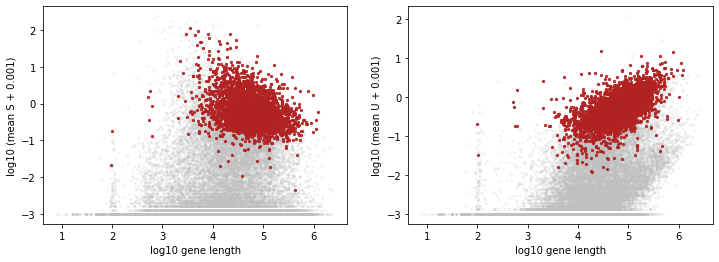

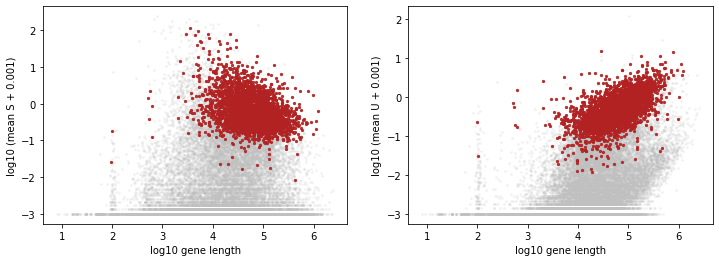

...

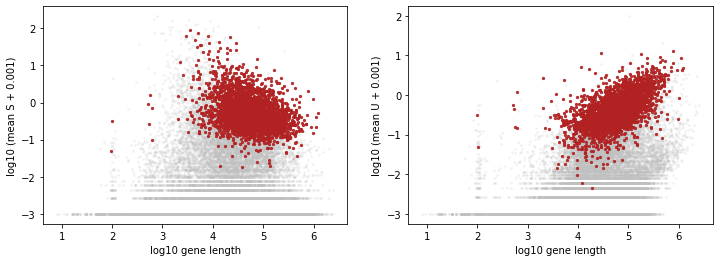

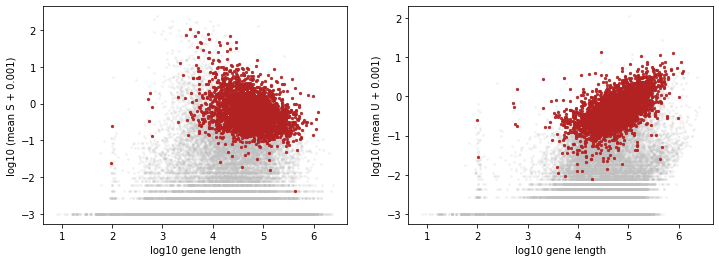

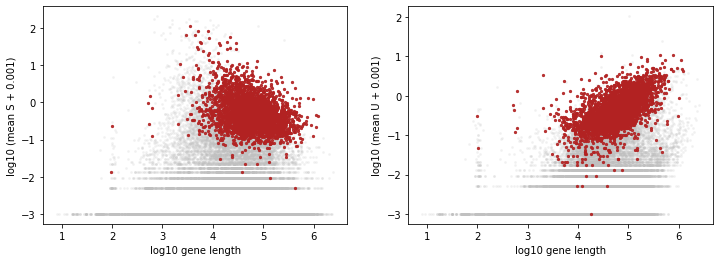

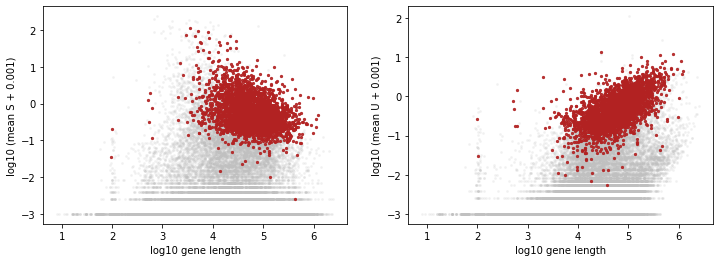

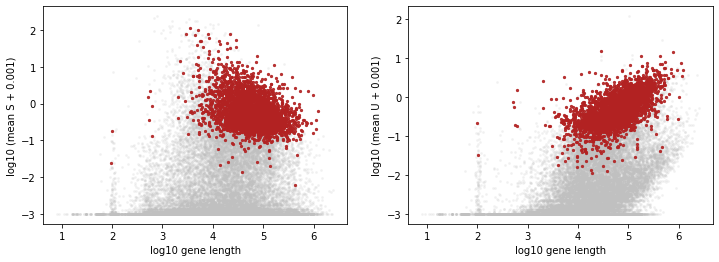

In [11]:
#Define bounds
phys_lb = [-2.0, -1.8, -1.8 ] #-1.0, -1.8, -1.8
phys_ub = [4.2, 2.5, 2.5] #4.2, 2.5, 3.5
samp_lb = [-9, -4] #-7.5, -2
samp_ub = [-4, 1.5] #-5.5, 0
# gridsize = [5,6]
gridsize = [20,21]



result_strings = []
for i in range(n_datasets):
    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')
    inference_parameters = monod.inference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,use_lengths = True,
                gradient_params = {'max_iterations':10,'init_pattern':'moments','num_restarts':1})
    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, dataset_attr_names=attribute_names,cf=cf[i])
    full_result_string = inference_parameters.fit_all_grid_points(60,search_data)

    result_strings.append(full_result_string)

In [12]:
#All result files
result_strings

['./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
 './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
 './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
 './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
 './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
 './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
 './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
 './fits/gg_221005_024_norman_c

In [7]:
# result_strings = ['./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res']

## **QC and Analysis of Results**

Look at optimum parameter fits, remove poorly fit genes, compute errors, save analyses

*STUDY does not use NegCtrl1_NegCtrl0

In [9]:
dir_string = './fits/gg_221005_024_norman_crispr_0'

INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-square computation complete. Rejected 1013 genes out of 3000. Runtime: 1.7 seconds.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_all

INFO:root:Gene 2562 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2576 ran into singularity; replaced with mean. (Search converged to local minimum?) 
INFO:root:Gene 2602 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2822 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2827 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2888 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2904 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2927 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2962 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2973 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures created.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-square computation complete. Rejected 664 genes out of 3000. Runtime: 1.7 s

INFO:root:Gene 1832 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1922 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1928 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1935 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1957 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2030 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2096 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2114 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2118 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2127 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Standard error of the MLE computation complete. Runtime: 40.3 seconds.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MA

INFO:root:Gene 2434 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2535 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2536 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2562 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2589 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2626 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2639 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2697 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2737 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2748 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/ggorin/projects/monod/src/monod/inference.py:1000: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, ax1 = plt.subplots(nrows=1, ncols=num_params, figsize=figsize)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distri

INFO:root:Gene 1721 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1725 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1782 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1794 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1821 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1828 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1859 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1882 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1922 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1950 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Ch

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0

INFO:root:Gene 2491 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2510 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2530 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2557 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2579 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2584 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2621 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2626 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2751 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2879 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poiss

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-squ

INFO:root:Gene 2795 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2863 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2888 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2962 ran into singularity; replaced with mean. (Search converged to local minimum?) 
INFO:root:Gene 2987 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Standard error of the MLE computation complete. Runtime: 44.9 seconds.


/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-square computation complete. Rejected 613 gene

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-square computation complete. Rejected 752 genes out of 3000. Runtime: 1.7 seconds.

INFO:root:Gene 1080 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1082 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1087 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1119 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1127 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1155 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1170 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1203 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1239 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1252 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Gene 2497 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2532 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2540 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2548 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2550 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2576 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2586 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2618 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2642 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2682 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_2

INFO:root:Gene 2927 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2962 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2973 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2975 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Standard error of the MLE computation complete. Runtime: 48.8 seconds.


/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been 

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4156: RuntimeWarning: invalid value encountered in multiply
  return fac1 * sc.k1e(a * sq) * np.exp(b*x - a*sq) / sq
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.


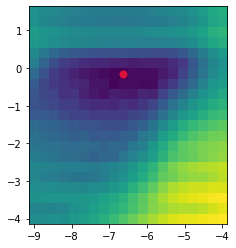

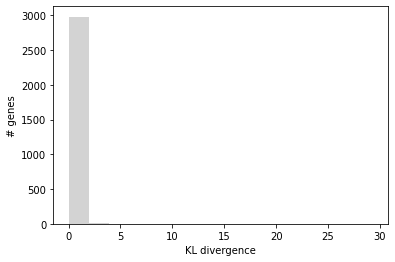

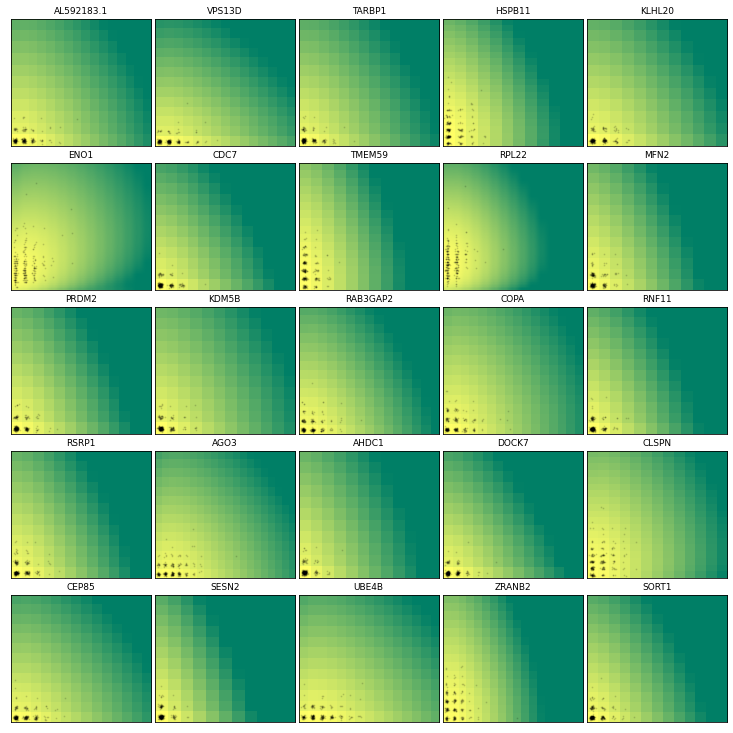

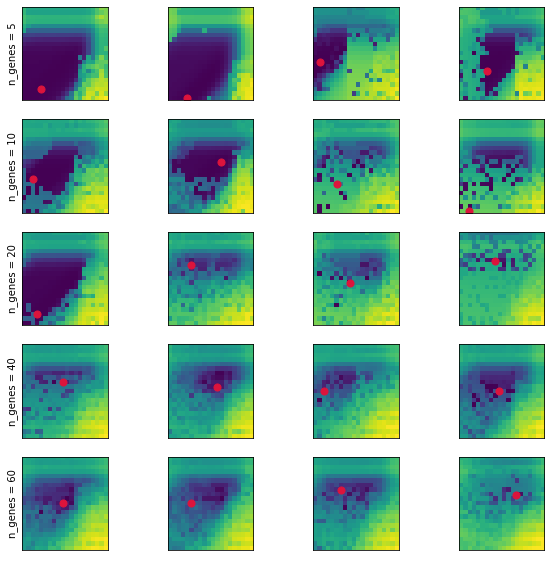

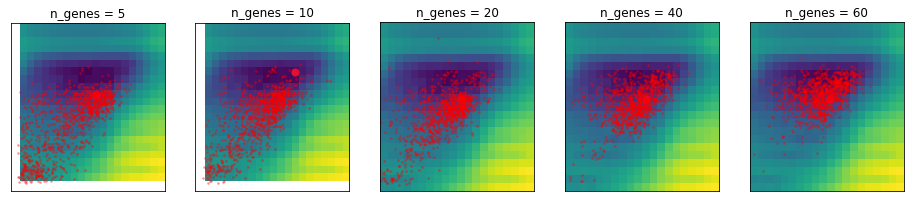

...

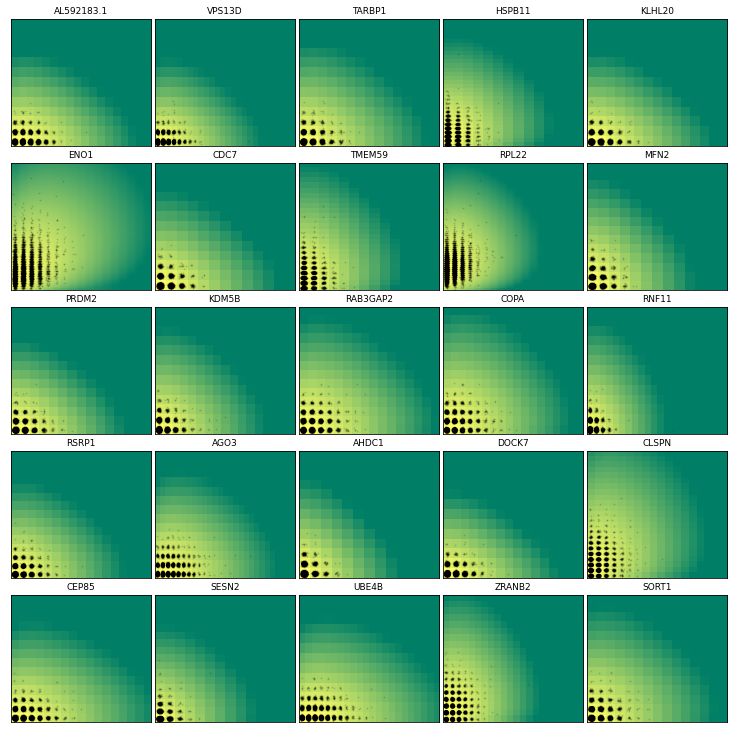

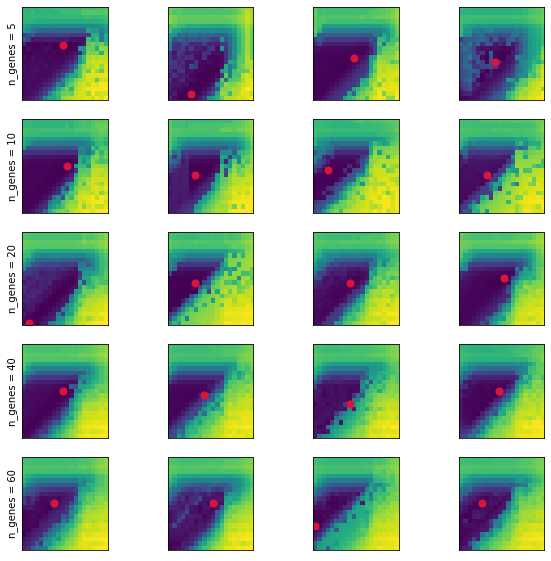

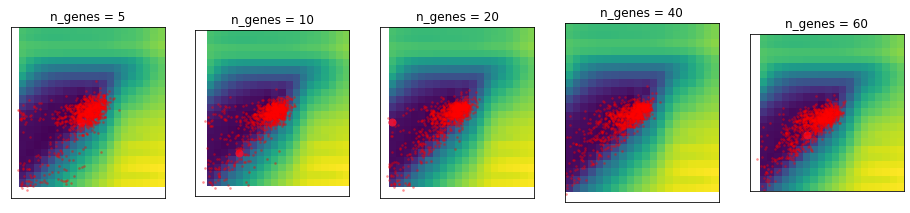

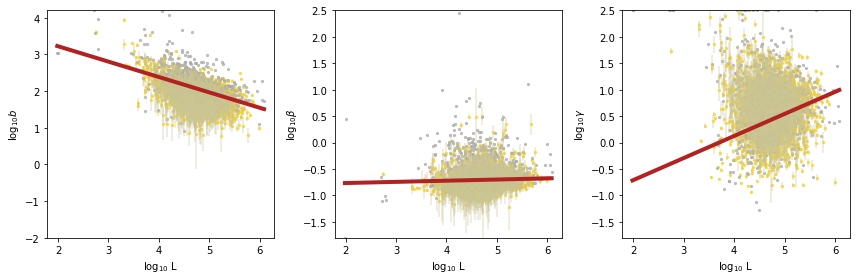

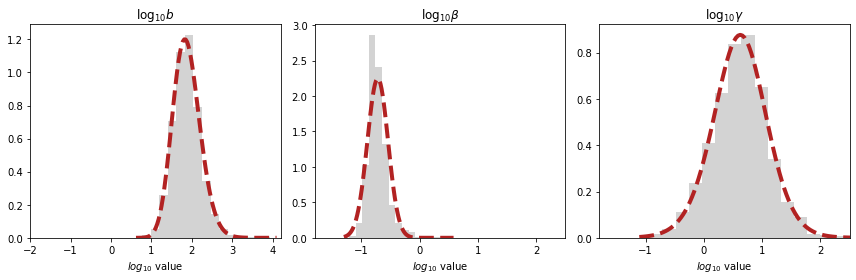

In [11]:
for i in range(n_datasets):
    sr = monod.analysis.load_search_results(result_strings[i])
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    fig1,ax1 = plt.subplots(1,1)
    sr.find_sampling_optimum()
    sr.plot_landscape(ax1)

    fig1,ax1 = plt.subplots(1,1)
    sr.plot_KL(ax1)

    sr.plot_gene_distributions(sd,marg='joint')

    _=sr.chisquare_testing(sd,threshold=1e-3)
    sr.resample_opt_viz()
    sr.resample_opt_mc_viz()
    sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

    sr.compute_sigma(sd,num_cores=60)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
    sr.plot_param_marg()
    
    monod.analysis.make_batch_analysis_dir([sr],dir_string)
    sr.update_on_disk()
    

In [14]:
sr.samp_optimum

(-7.684210526315789, -1.525)

In [16]:
#Read back in data
sr_arr = [monod.analysis.load_search_results(r[:-4]+'_upd.res') for r in result_strings]

INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1

In [23]:
for i in range(len(dataset_names)):
    print(str(i)+': '+dataset_names[i])

0: norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1
1: norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1
2: norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1
3: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0
4: norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0
5: norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0
6: norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0
7: norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2
8: norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0
9: norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0
10: norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0
11: norman_allcrispr_CBL_CNN1__CBL_CNN1
12: norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0
13: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0


(-6.631578947368421, -0.14999999999999947)
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-6.631578947368421, -0.4249999999999998)
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-7.157894736842105, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-9.0, -1.525)
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-7.157894736842105, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0

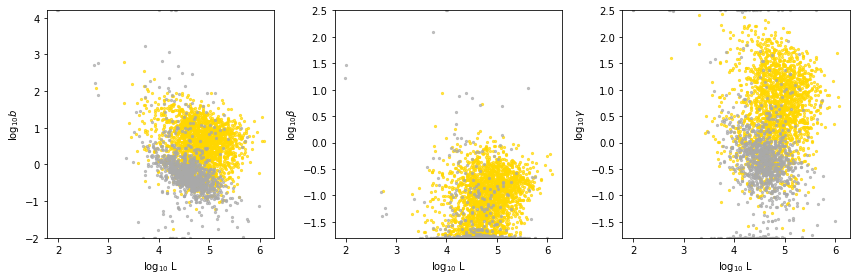

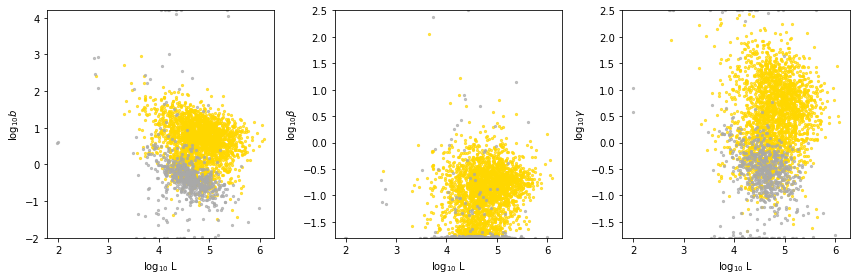

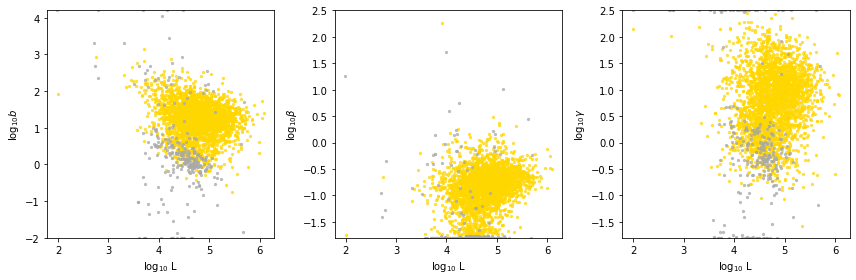

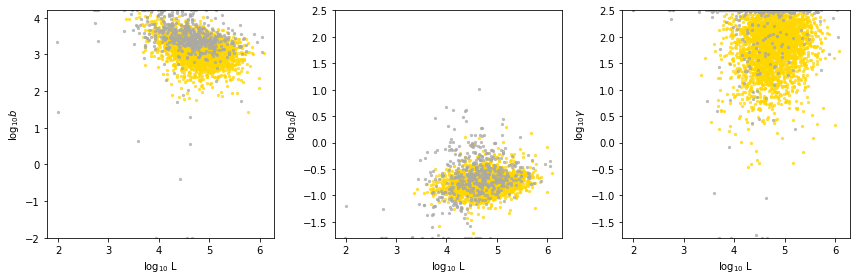

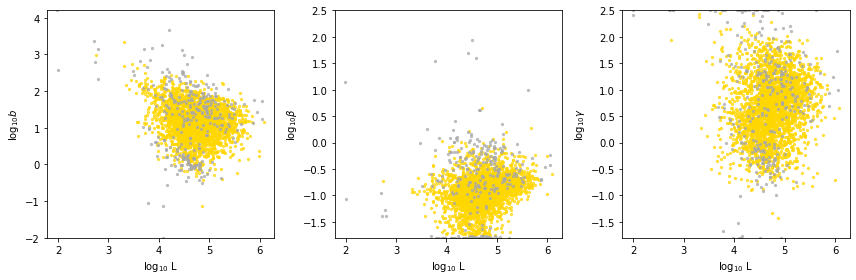

...

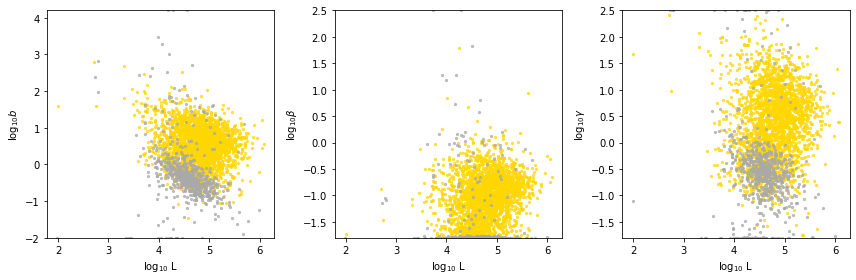

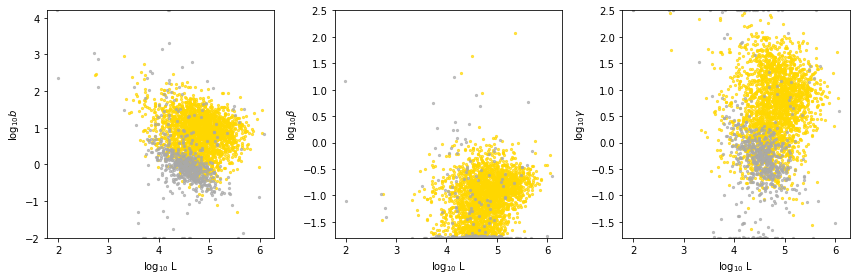

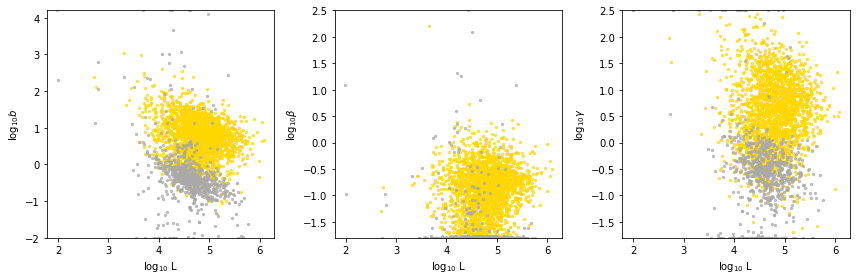

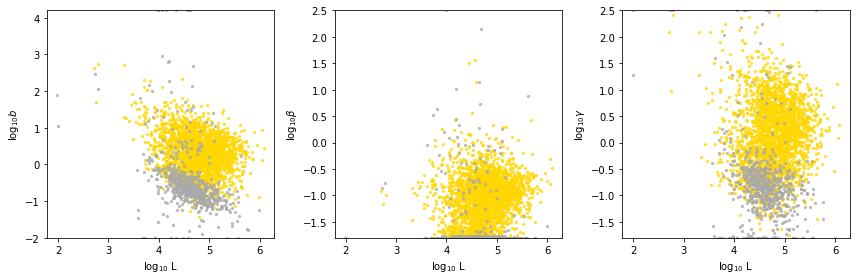

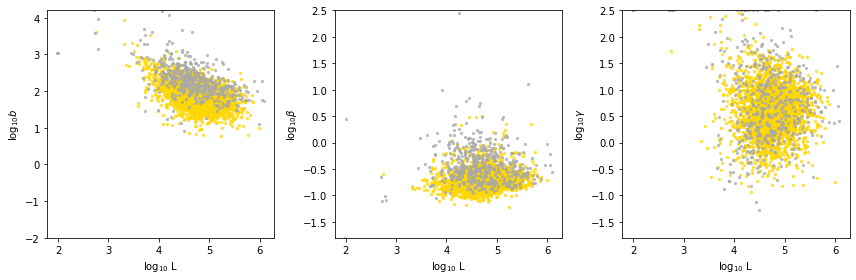

In [72]:
opt=[]
n_cells = []
for sr in sr_arr:
    y = sr.samp_optimum
    print(y)
    opt.append(y)
    n_cells.append(sr.n_cells)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
opt = np.asarray(opt)
n_cells = np.asarray(n_cells)

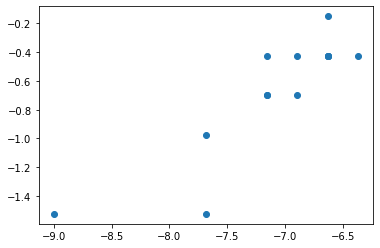

In [26]:
plt.scatter(opt[:,0],opt[:,1])

In [31]:
xl = np.asarray([sr.sp.samp_lb[0],sr.sp.samp_ub[0]])
yl = np.asarray([sr.sp.samp_lb[1],sr.sp.samp_ub[1]])
x=np.linspace(xl[0],xl[1],sr.sp.gridsize[0])
y=np.linspace(yl[0],yl[1],sr.sp.gridsize[1])

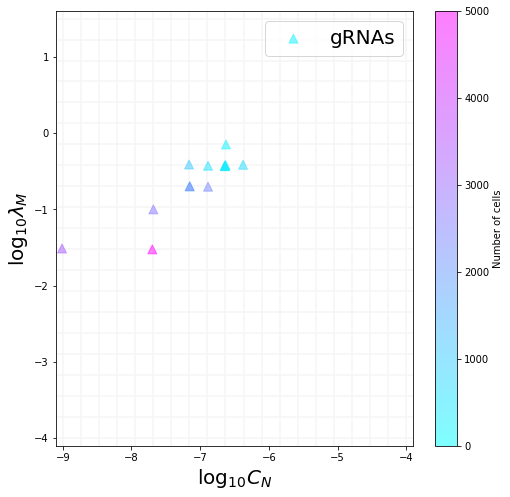

In [37]:
fs = 20
d=0.1

fig1,ax1 = plt.subplots(1,1,figsize=(8,8))
for i in range(sr.sp.gridsize[0]):
    plt.plot([x[i]]*2,yl + [-d,d],c='whitesmoke')
for i in range(sr.sp.gridsize[1]):
    plt.plot(xl+ [-d,d],[y[i]]*2,c='whitesmoke')
jit = np.random.randn(n_datasets,2)*0.01
opt_ = opt+jit
cmap = 'cool'

# ctf = range(6,n_datasets)
# plt.scatter(opt_[ctf,0],opt_[ctf,1],100,n_cells[ctf],zorder=1000,
#             alpha=0.3,cmap=cmap,label='Cell types',vmin=0,vmax=5000)

stf = range(n_datasets) #-1 to exclude combo control

plt.scatter(opt_[stf,0],opt_[stf,1],80,n_cells[stf],marker='^',zorder=1000,
            alpha=0.5,cmap=cmap,label='gRNAs',vmin=0,vmax=5000)
plt.xlim(xl+ [-d,d])
plt.ylim(yl+ [-d,d])

plt.legend(fontsize=fs,loc='upper right')
plt.colorbar(label='Number of cells')

plt.xlabel(r'$\log_{10} C_N$',fontsize=fs)
plt.ylabel(r'$\log_{10} \lambda_M$',fontsize=fs)

fig_string = sr.batch_analysis_string+'/landscape_qc.png'
plt.savefig(fig_string,dpi=450)

In [55]:
#See paired results
control = 6

n_genes = sr_arr[0].n_genes
n_phys_pars = sr_arr[0].sp.n_phys_pars
par_vals_uncorrected = np.zeros((2,n_datasets,n_genes,n_phys_pars))


for j in range(n_datasets):
    par_vals_uncorrected[0,j,:,:] = sr_arr[control].phys_optimum
    par_vals_uncorrected[1,j,:,:] = sr_arr[j].phys_optimum


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures

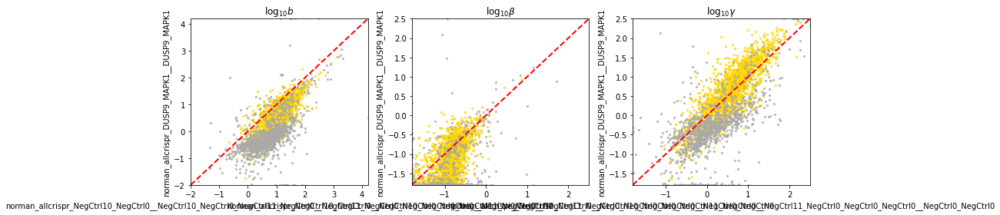

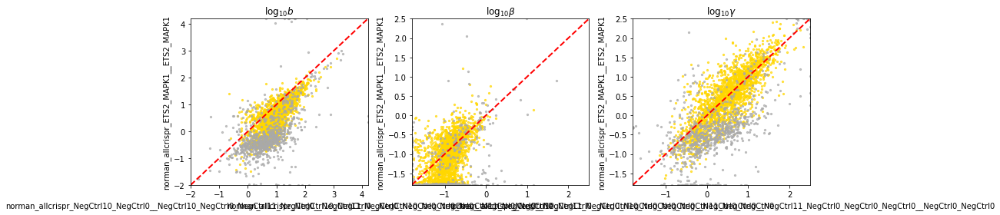

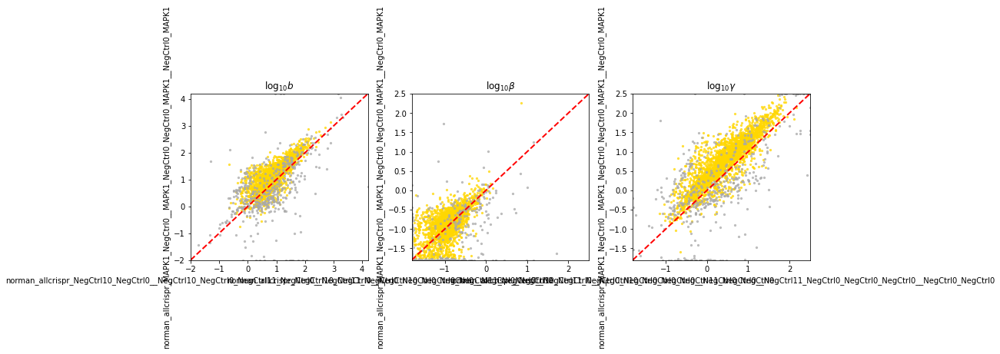

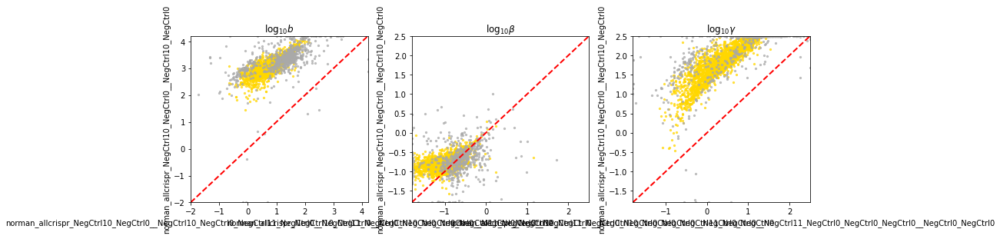

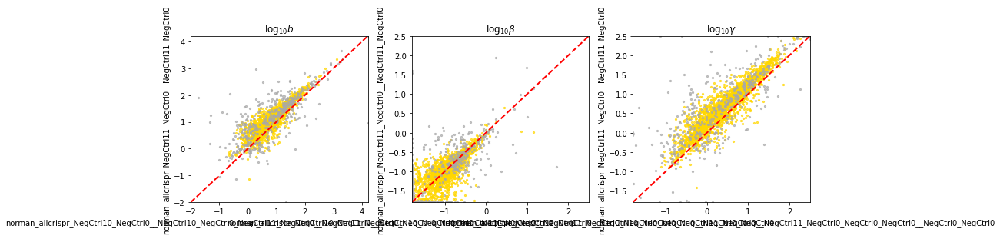

...

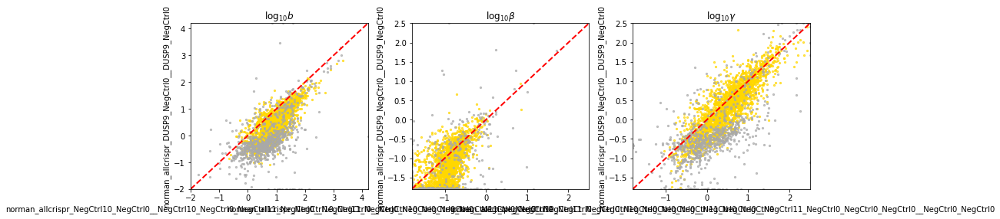

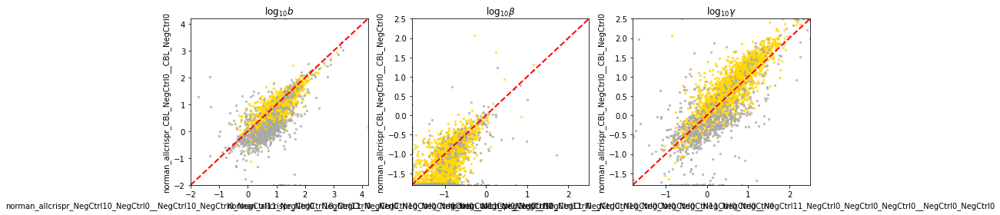

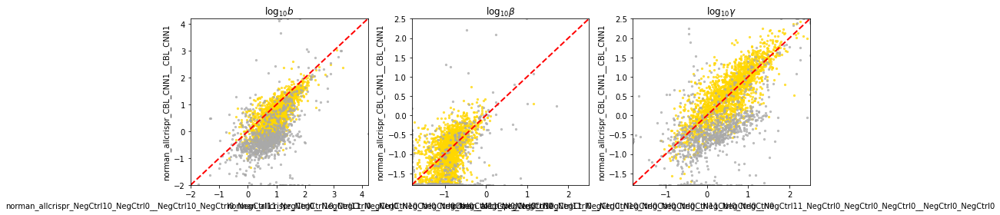

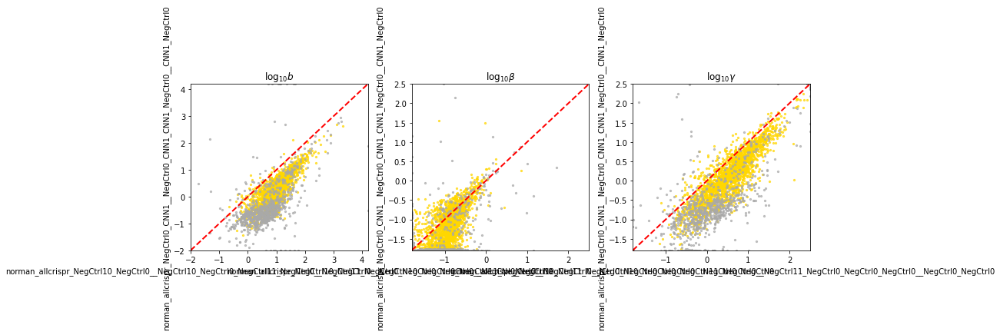

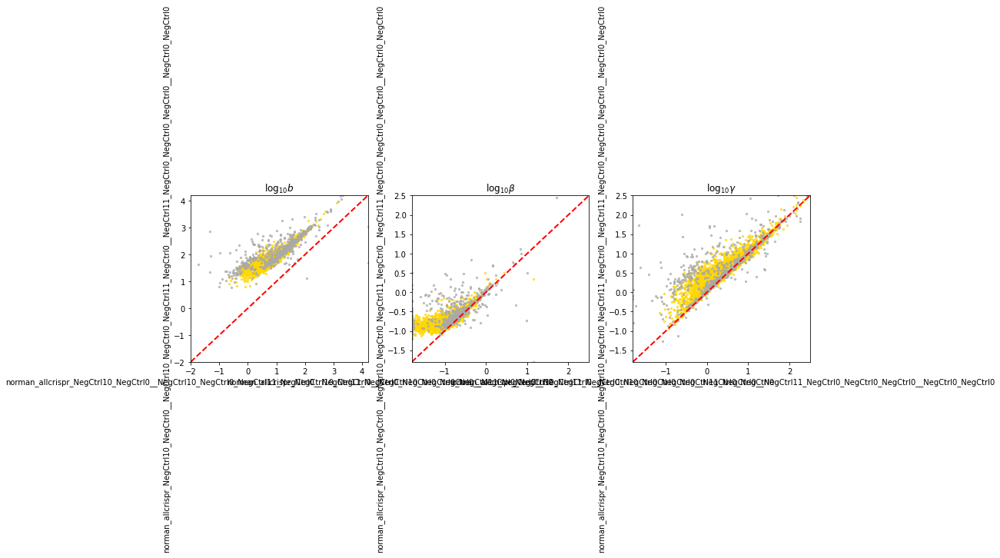

In [61]:
for j in range(n_datasets):
    monod.analysis.plot_params_for_pair(sr_arr[6],sr_arr[j],\
                         distinguish_rej=True,plot_errorbars=False,xlabel = dataset_names[13],\
                         ylabel = dataset_names[j])

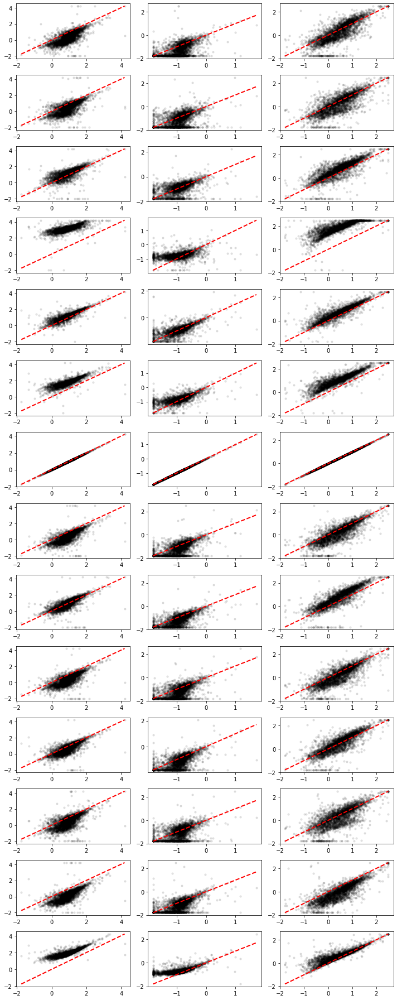

In [56]:
fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(10,25))
for d in range(n_datasets):
    for k in range(n_phys_pars):
        x=par_vals_uncorrected[0,d,:,k]
        y=par_vals_uncorrected[1,d,:,k]
        xl = [min(x),max(x)]
        ax1[d,k].scatter(x,y,10,'k',alpha=0.1) 

        ax1[d,k].plot(xl,xl,'r--',linewidth=2)
fig1.tight_layout()

In [63]:
offsets = []
param_names = sr_arr[0].model.get_log_name_str()
par_vals = np.copy(par_vals_uncorrected)
for k in range(n_phys_pars):
    m1 = par_vals_uncorrected[0,control,:,k]
#     for j in range(1,n_datasets):
#         m2 = par_vals_uncorrected[0,j,:,k]
#         offset = monod.analysis.diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
#         par_vals[0,j,:,k] -= offset
    for j in range(n_datasets):
        m2 = par_vals_uncorrected[1,j,:,k]
        offset = monod.analysis.diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
        par_vals[1,j,:,k] -= offset

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/home/ggorin/projects/monod/src/monod/analysis.py:724: RuntimeWarning: invalid value encountered in true_divide
  z = (resid - fitparams[0]) / fitparams[1]


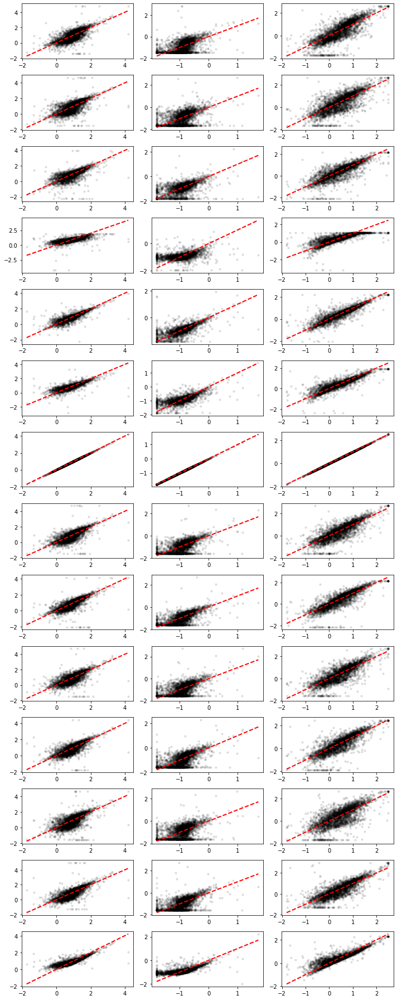

In [65]:
fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(10,25))
for d in range(n_datasets):
    for k in range(n_phys_pars):
        x=par_vals[0,d,:,k]
        y=par_vals[1,d,:,k]
        xl = [min(x),max(x)]
        ax1[d,k].scatter(x,y,10,'k',alpha=0.1) 

        ax1[d,k].plot(xl,xl,'r--',linewidth=2)
fig1.tight_layout()

In [73]:
#Get reject gene ovleraps for plotting + predicting

In [67]:
len(sr_arr[0].rejected_genes)


3000

In [71]:
sr_arr[0].phys_optimum.shape

(3000, 3)